#Simple 2D K-means


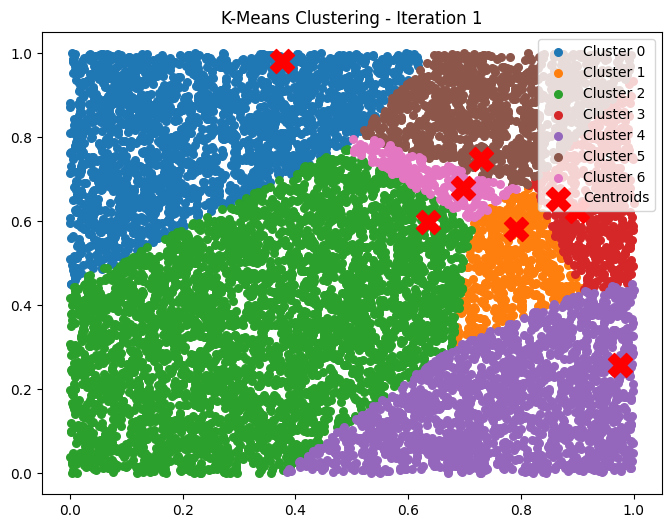

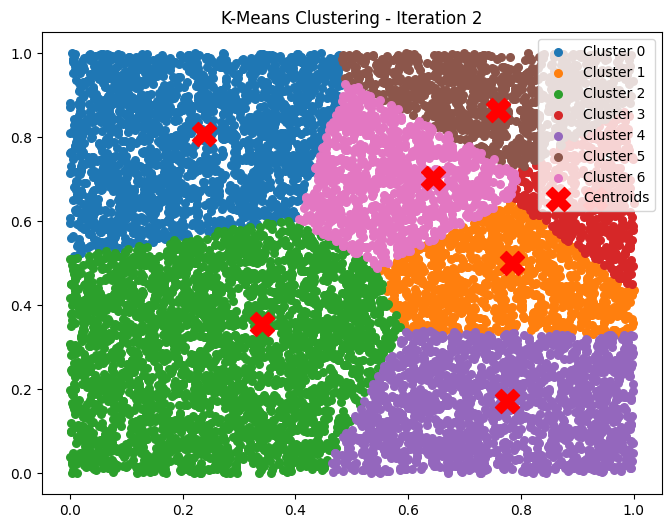

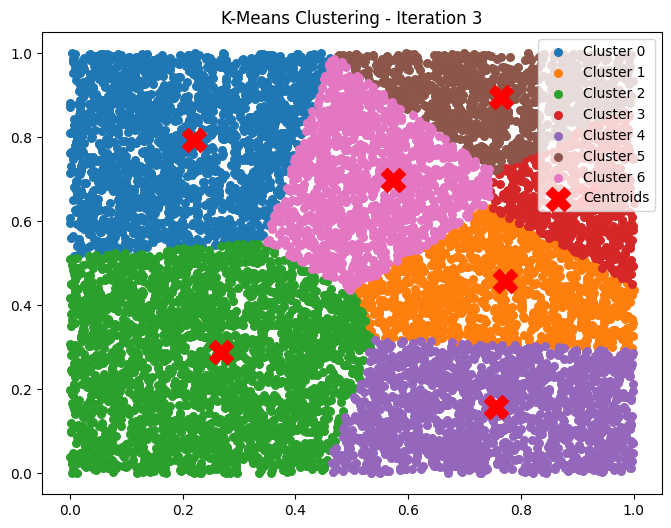

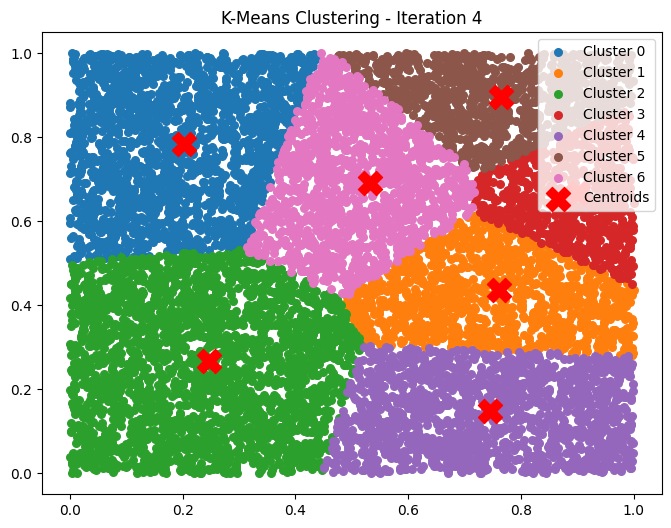

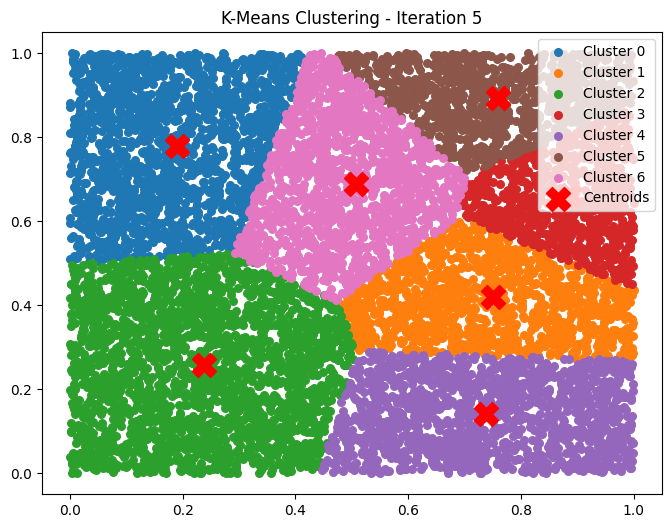

...

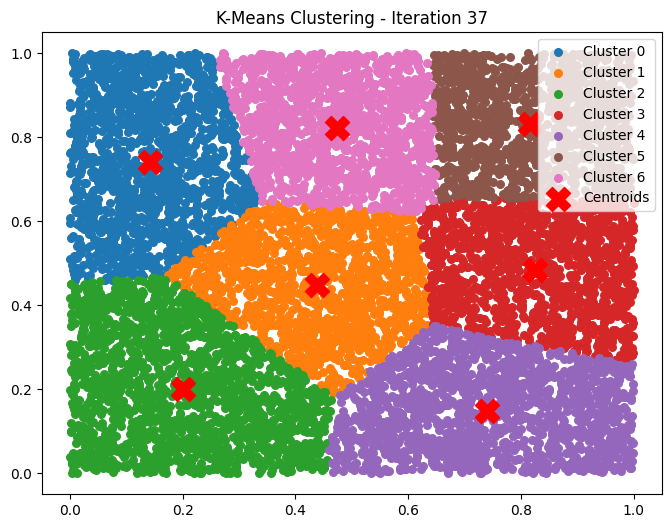

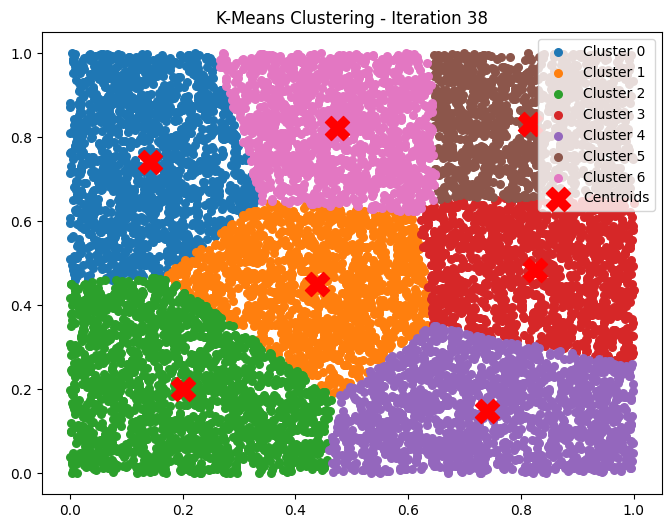

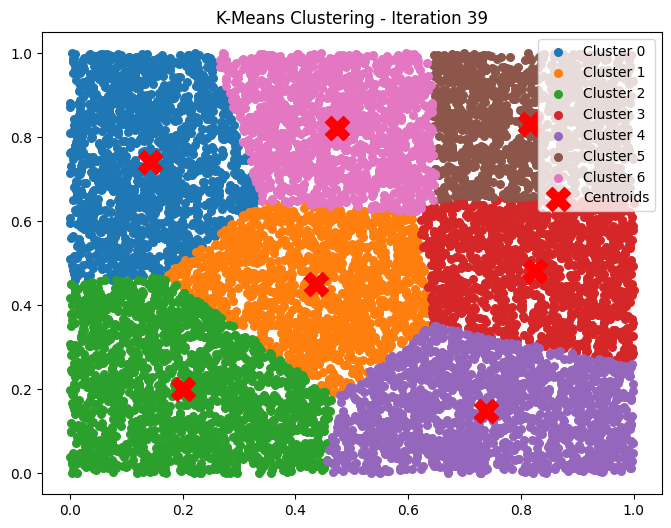

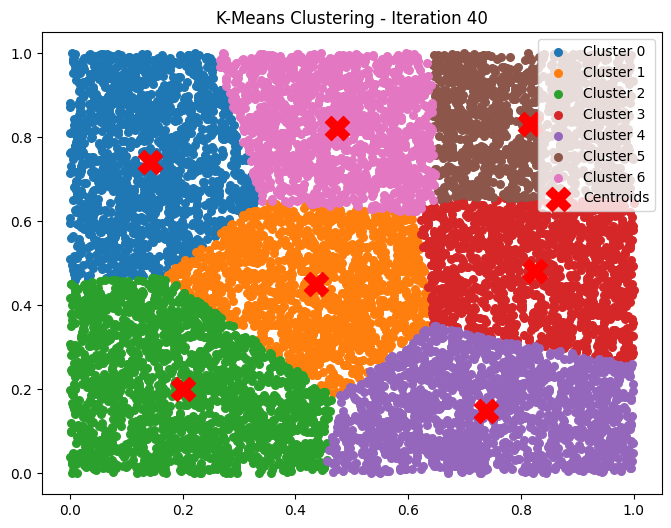

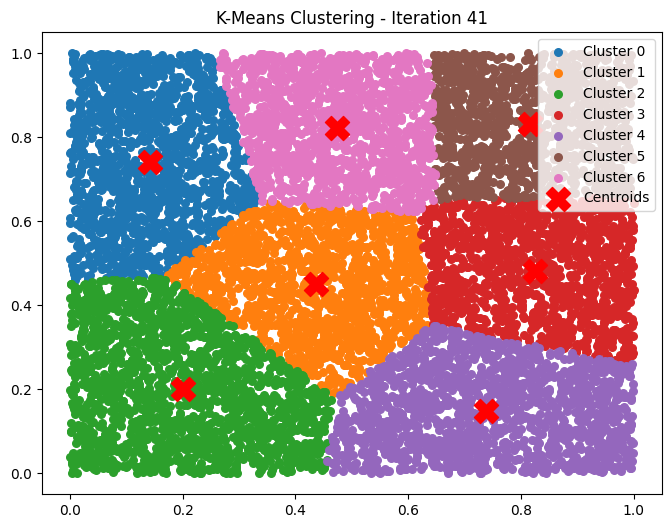

Final Centroids:
[[0.14154978 0.74211399]
 [0.43702616 0.4497691 ]
 [0.20083502 0.20077847]
 [0.82565826 0.48248785]
 [0.73871945 0.14880464]
 [0.81668806 0.83050314]
 [0.47334703 0.82168812]]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def initialize_centroids(X, k):

    np.random.seed(42)  # For reproducibility
    random_indices = np.random.permutation(X.shape[0])
    centroids = X[random_indices[:k]]
    return centroids

def assign_clusters(X, centroids):
    # assign each point to its centroid
    distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)
    return np.argmin(distances, axis=1)

def update_centroids(X, labels, k):
    # recompute centroids
    new_centroids = np.array([X[labels == i].mean(axis=0) for i in range(k)])
    return new_centroids

def has_converged(old_centroids, new_centroids, tol=1e-4):
    return np.all(np.linalg.norm(new_centroids - old_centroids, axis=1) < tol)

def plot_progress(X, centroids, labels, iteration):
    plt.figure(figsize=(8, 6))
    for i in range(len(centroids)):
        points = X[labels == i]
        plt.scatter(points[:, 0], points[:, 1], s=30, label=f'Cluster {i}')
    plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
    plt.title(f'K-Means Clustering - Iteration {iteration}')
    plt.legend()
    plt.show()

def kmeans(X, k, max_iters=300, tol=1e-4, plot=False):
    centroids = initialize_centroids(X, k)

    for i in range(max_iters):
        labels = assign_clusters(X, centroids)
        new_centroids = update_centroids(X, labels, k)

        if plot:
            plot_progress(X, centroids, labels, i + 1)

        if has_converged(centroids, new_centroids, tol):
            break

        centroids = new_centroids

    return centroids, labels

if __name__ == "__main__":
    np.random.seed(42)
    X = np.random.rand(10000, 2)

    # Run K-Means with plotting enabled
    k = 7
    centroids, labels = kmeans(X, k, plot=True)

    print("Final Centroids:")
    print(centroids)


#non-optimized K-means for lena

Clustered image saved to lena_quantized.png


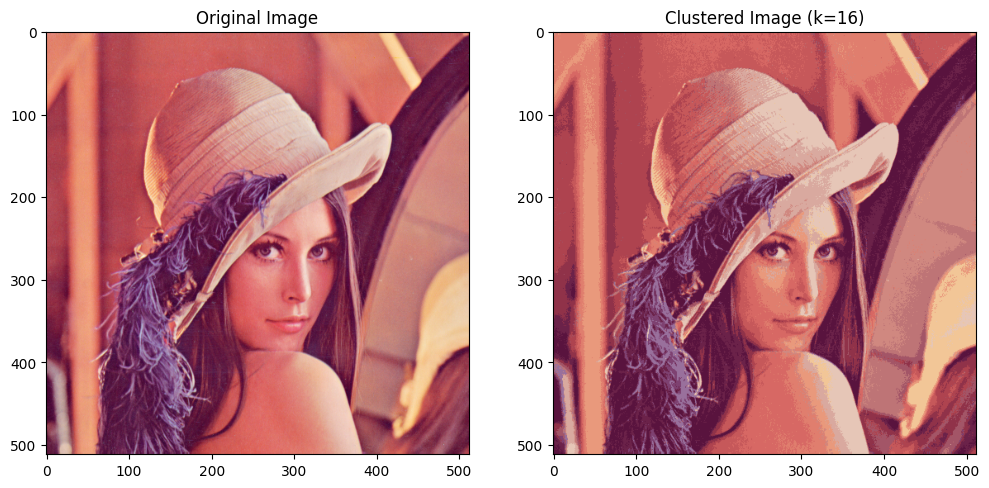

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def initialize_centroids(X, k):
    np.random.seed(42)  # For reproducibility
    random_indices = np.random.permutation(X.shape[0])
    centroids = X[random_indices[:k]]
    return centroids

def assign_clusters(X, centroids):
    distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)
    return np.argmin(distances, axis=1)

def update_centroids(X, labels, k):
    new_centroids = np.array([X[labels == i].mean(axis=0) for i in range(k)])
    return new_centroids

def has_converged(old_centroids, new_centroids, tol=1e-4):
    return np.all(np.linalg.norm(new_centroids - old_centroids, axis=1) < tol)

def plot_progress(X, centroids, labels, iteration):
    plt.figure(figsize=(8, 6))
    for i in range(len(centroids)):
        points = X[labels == i]
        plt.scatter(points[:, 0], points[:, 1], s=30, label=f'Cluster {i}')
    plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
    plt.title(f'K-Means Clustering - Iteration {iteration}')
    plt.legend()
    plt.show()

def log_l2_norm(X, centroids, labels, iteration):

    l2_norm = np.sum(np.linalg.norm(X - centroids[labels], axis=1))
    with open("L2_norm_log.txt", "a") as f:
        f.write(f"Iteration {iteration}: Total L2 norm = {l2_norm:.6f}\n")

def kmeans(X, k, max_iters=300, tol=1e-4, plot=False):
    centroids = initialize_centroids(X, k)

    for i in range(max_iters):
        labels = assign_clusters(X, centroids)
        new_centroids = update_centroids(X, labels, k)

        # Log the L2 norm between all data points and their assigned centroids
        log_l2_norm(X, new_centroids, labels, i + 1)

        if plot:
            plot_progress(X, centroids, labels, i + 1)

        if has_converged(centroids, new_centroids, tol):
            break

        centroids = new_centroids

    return centroids, labels

def load_image(image_path):
    image = Image.open(image_path)
    image = np.array(image)
    return image

def preprocess_image(image):
    return image.reshape(-1, image.shape[2])

def reconstruct_image(centroids, labels, image_shape):
    reconstructed_image = centroids[labels].reshape(image_shape)
    return reconstructed_image

def save_image(image, output_path):

    Image.fromarray(image.astype(np.uint8)).save(output_path)

def kmeans_image(image_path, k, output_path, max_iters=300, tol=1e-4, plot=False):

    image = load_image(image_path)
    X = preprocess_image(image)
    centroids, labels = kmeans(X, k, max_iters, tol, plot)
    clustered_image = reconstruct_image(centroids, labels, image.shape)

    save_image(clustered_image, output_path)
    print(f"Clustered image saved to {output_path}")

if __name__ == "__main__":
    # Run K-Means on an image and save the result
    image_path = 'lena.png'
    output_path = 'lena_quantized.png'
    k = 16
    outPlot = True
    kmeans_image(image_path, k, output_path, plot=False)

    # Optionally display the original and clustered images
    if(outPlot):
      original_image = load_image(image_path)
      clustered_image = load_image(output_path)

      plt.figure(figsize=(12, 6))

      plt.subplot(1, 2, 1)
      plt.imshow(original_image)
      plt.title('Original Image')

      plt.subplot(1, 2, 2)
      plt.imshow(clustered_image)
      plt.title(f'Clustered Image (k={k})')

      plt.show()


#non-optimized K-means for peppers

Clustered image saved to peppers_quantized.png


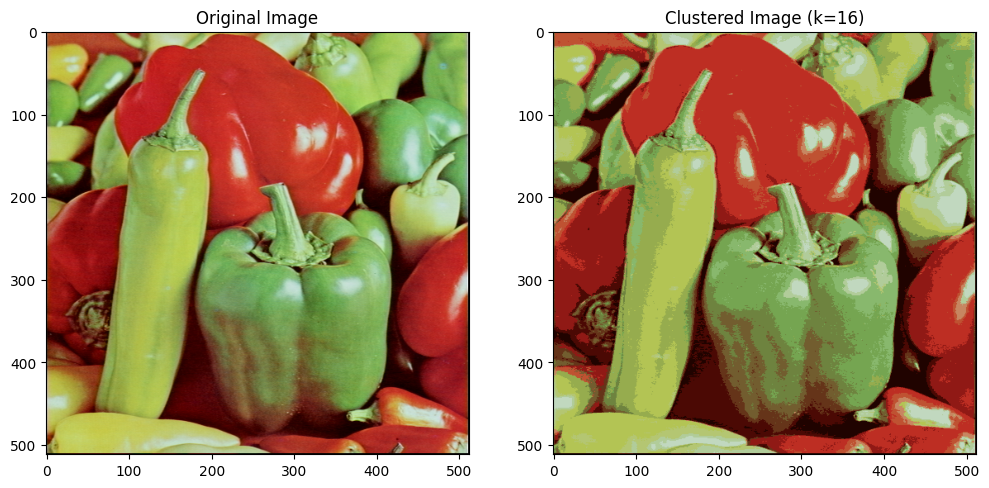

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def initialize_centroids(X, k):
    np.random.seed(42)  # For reproducibility
    random_indices = np.random.permutation(X.shape[0])
    centroids = X[random_indices[:k]]
    return centroids

def assign_clusters(X, centroids):
    distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)
    return np.argmin(distances, axis=1)

def update_centroids(X, labels, k):
    new_centroids = np.array([X[labels == i].mean(axis=0) for i in range(k)])
    return new_centroids

def has_converged(old_centroids, new_centroids, tol=1e-4):
    return np.all(np.linalg.norm(new_centroids - old_centroids, axis=1) < tol)

def plot_progress(X, centroids, labels, iteration):
    plt.figure(figsize=(8, 6))
    for i in range(len(centroids)):
        points = X[labels == i]
        plt.scatter(points[:, 0], points[:, 1], s=30, label=f'Cluster {i}')
    plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
    plt.title(f'K-Means Clustering - Iteration {iteration}')
    plt.legend()
    plt.show()

def log_l2_norm(X, centroids, labels, iteration):

    l2_norm = np.sum(np.linalg.norm(X - centroids[labels], axis=1))
    with open("L2_norm_log.txt", "a") as f:
        f.write(f"Iteration {iteration}: Total L2 norm = {l2_norm:.6f}\n")

def kmeans(X, k, max_iters=300, tol=1e-4, plot=False):
    centroids = initialize_centroids(X, k)

    for i in range(max_iters):
        labels = assign_clusters(X, centroids)
        new_centroids = update_centroids(X, labels, k)

        # Log the L2 norm between all data points and their assigned centroids
        log_l2_norm(X, new_centroids, labels, i + 1)

        if plot:
            plot_progress(X, centroids, labels, i + 1)

        if has_converged(centroids, new_centroids, tol):
            break

        centroids = new_centroids

    return centroids, labels

def load_image(image_path):
    image = Image.open(image_path)
    image = np.array(image)
    return image

def preprocess_image(image):
    return image.reshape(-1, image.shape[2])

def reconstruct_image(centroids, labels, image_shape):
    reconstructed_image = centroids[labels].reshape(image_shape)
    return reconstructed_image

def save_image(image, output_path):

    Image.fromarray(image.astype(np.uint8)).save(output_path)

def kmeans_image(image_path, k, output_path, max_iters=300, tol=1e-4, plot=False):

    image = load_image(image_path)
    X = preprocess_image(image)
    centroids, labels = kmeans(X, k, max_iters, tol, plot)
    clustered_image = reconstruct_image(centroids, labels, image.shape)

    save_image(clustered_image, output_path)
    print(f"Clustered image saved to {output_path}")

if __name__ == "__main__":
    # Run K-Means on an image and save the result
    image_path = 'peppers.tif'
    output_path = 'peppers_quantized.png'
    k = 16
    outPlot = True
    kmeans_image(image_path, k, output_path, plot=False)

    # Optionally display the original and clustered images
    if(outPlot):
      original_image = load_image(image_path)
      clustered_image = load_image(output_path)

      plt.figure(figsize=(12, 6))

      plt.subplot(1, 2, 1)
      plt.imshow(original_image)
      plt.title('Original Image')

      plt.subplot(1, 2, 2)
      plt.imshow(clustered_image)
      plt.title(f'Clustered Image (k={k})')

      plt.show()


#optimized K-means for lena

Clustered image saved to lena_quantized.png


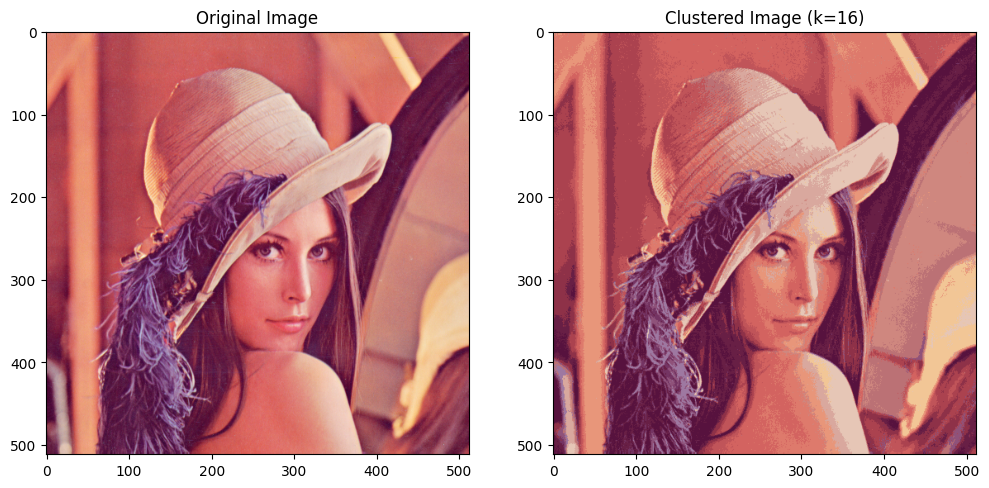

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def initialize_centroids(X, k, method='random'):
    np.random.seed(42)
    if method == 'random':
        random_indices = np.random.permutation(X.shape[0])
        centroids = X[random_indices[:k]]
    elif method == 'kmeans++':
        centroids = [X[np.random.randint(0, X.shape[0])]]
        for _ in range(1, k):
            distances = np.min(np.linalg.norm(X[:, None] - np.array(centroids), axis=2), axis=1)
            probs = distances / distances.sum()
            cumulative_probs = np.cumsum(probs)
            r = np.random.rand()
            new_centroid = X[np.searchsorted(cumulative_probs, r)]
            centroids.append(new_centroid)
        centroids = np.array(centroids)
    return centroids

def assign_clusters(X, centroids):
    distances = np.linalg.norm(X[:, None] - centroids, axis=2)
    return np.argmin(distances, axis=1)

def update_centroids(X, labels, k):
    centroids = np.zeros((k, X.shape[1]))
    for i in range(k):
        cluster_points = X[labels == i]
        if len(cluster_points) > 0:
            centroids[i] = np.mean(cluster_points, axis=0)
    return centroids

def plot_progress(X, centroids, labels, iteration):
    plt.figure(figsize=(8, 6))
    for i in range(len(centroids)):
        points = X[labels == i]
        plt.scatter(points[:, 0], points[:, 1], s=10, label=f'Cluster {i}', alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
    plt.title(f'K-Means Clustering - Iteration {iteration}')
    plt.legend()
    plt.xlabel('Channel 1')
    plt.ylabel('Channel 2')
    plt.show()

def log_l2_norm(X, centroids, labels, iteration):

    l2_norm = np.sum(np.linalg.norm(X - centroids[labels], axis=1))
    with open("L2_norm_log.txt", "a") as f:
        f.write(f"Iteration {iteration}: Total L2 norm = {l2_norm:.6f}\n")

def kmeans(X, k, max_iters=300, tol=1e-4, plot=False, X_plot=None, init_method='random'):
    centroids = initialize_centroids(X, k, method=init_method)

    for i in range(max_iters):
        labels = assign_clusters(X, centroids)
        new_centroids = update_centroids(X, labels, k)

        # Log the L2 norm between all data points and their assigned centroids
        log_l2_norm(X, new_centroids, labels, i + 1)

        if plot and X_plot is not None:
            plot_progress(X_plot, new_centroids[:, :2], labels, i + 1)

        if np.all(np.linalg.norm(new_centroids - centroids, axis=1) < tol):
            break

        centroids = new_centroids

    return centroids, labels

def load_image(image_path):
    image = Image.open(image_path)
    image = np.array(image)
    return image

def preprocess_image(image):
    return image.reshape(-1, image.shape[2])

def reconstruct_image(centroids, labels, image_shape):
    return centroids[labels].reshape(image_shape)

def save_image(image, output_path):
    Image.fromarray(image.astype(np.uint8)).save(output_path)

def kmeans_image(image_path, k, output_path, max_iters=300, tol=1e-4, plot=False, init_method='random'):
    image = load_image(image_path)
    X = preprocess_image(image)

    if plot:
        X_plot = X[:, :2]
    else:
        X_plot = None

    centroids, labels = kmeans(X, k, max_iters, tol, plot, X_plot, init_method=init_method)
    clustered_image = reconstruct_image(centroids, labels, image.shape)
    save_image(clustered_image, output_path)
    print(f"Clustered image saved to {output_path}")

if __name__ == "__main__":
    image_path = 'lena.png'
    output_path = 'lena_quantized.png'
    k = 16
    outPlot = True
    kmeans_image(image_path, k, output_path, max_iters=100, plot=False, init_method='kmeans++')

    original_image = load_image(image_path)
    clustered_image = load_image(output_path)


    if(outPlot):
      plt.figure(figsize=(12, 6))

      plt.subplot(1, 2, 1)
      plt.imshow(original_image)
      plt.title('Original Image')

      plt.subplot(1, 2, 2)
      plt.imshow(clustered_image)
      plt.title(f'Clustered Image (k={k})')

      plt.show()


#optimized K-means for peppers

Clustered image saved to peppers_quantized.png


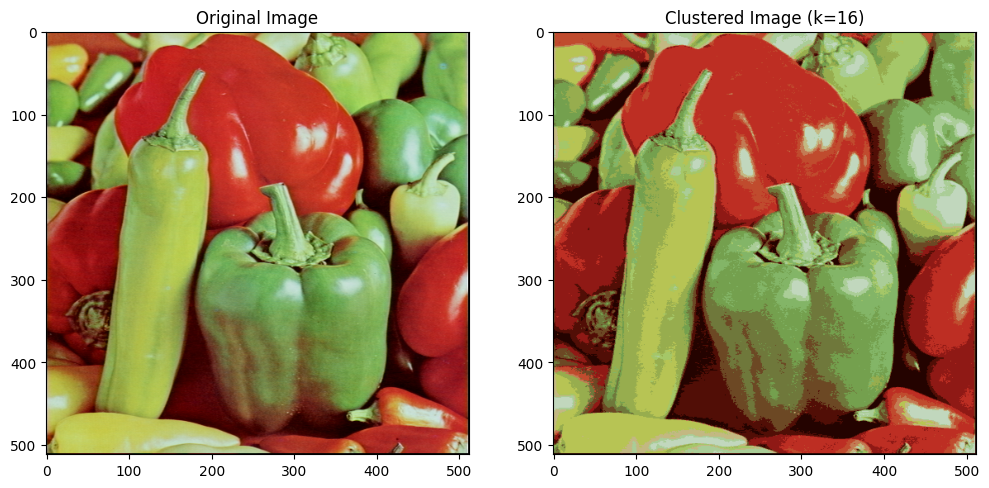

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def initialize_centroids(X, k, method='random'):
    np.random.seed(42)
    if method == 'random':
        random_indices = np.random.permutation(X.shape[0])
        centroids = X[random_indices[:k]]
    elif method == 'kmeans++':
        centroids = [X[np.random.randint(0, X.shape[0])]]
        for _ in range(1, k):
            distances = np.min(np.linalg.norm(X[:, None] - np.array(centroids), axis=2), axis=1)
            probs = distances / distances.sum()
            cumulative_probs = np.cumsum(probs)
            r = np.random.rand()
            new_centroid = X[np.searchsorted(cumulative_probs, r)]
            centroids.append(new_centroid)
        centroids = np.array(centroids)
    return centroids

def assign_clusters(X, centroids):
    distances = np.linalg.norm(X[:, None] - centroids, axis=2)
    return np.argmin(distances, axis=1)

def update_centroids(X, labels, k):
    centroids = np.zeros((k, X.shape[1]))
    for i in range(k):
        cluster_points = X[labels == i]
        if len(cluster_points) > 0:
            centroids[i] = np.mean(cluster_points, axis=0)
    return centroids

def plot_progress(X, centroids, labels, iteration):
    plt.figure(figsize=(8, 6))
    for i in range(len(centroids)):
        points = X[labels == i]
        plt.scatter(points[:, 0], points[:, 1], s=10, label=f'Cluster {i}', alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
    plt.title(f'K-Means Clustering - Iteration {iteration}')
    plt.legend()
    plt.xlabel('Channel 1')
    plt.ylabel('Channel 2')
    plt.show()

def log_l2_norm(X, centroids, labels, iteration):

    l2_norm = np.sum(np.linalg.norm(X - centroids[labels], axis=1))
    with open("L2_norm_log.txt", "a") as f:
        f.write(f"Iteration {iteration}: Total L2 norm = {l2_norm:.6f}\n")

def kmeans(X, k, max_iters=300, tol=1e-4, plot=False, X_plot=None, init_method='random'):
    centroids = initialize_centroids(X, k, method=init_method)

    for i in range(max_iters):
        labels = assign_clusters(X, centroids)
        new_centroids = update_centroids(X, labels, k)

        # Log the L2 norm between all data points and their assigned centroids
        log_l2_norm(X, new_centroids, labels, i + 1)

        if plot and X_plot is not None:
            plot_progress(X_plot, new_centroids[:, :2], labels, i + 1)

        if np.all(np.linalg.norm(new_centroids - centroids, axis=1) < tol):
            break

        centroids = new_centroids

    return centroids, labels

def load_image(image_path):
    image = Image.open(image_path)
    image = np.array(image)
    return image

def preprocess_image(image):
    return image.reshape(-1, image.shape[2])

def reconstruct_image(centroids, labels, image_shape):
    return centroids[labels].reshape(image_shape)

def save_image(image, output_path):
    Image.fromarray(image.astype(np.uint8)).save(output_path)

def kmeans_image(image_path, k, output_path, max_iters=300, tol=1e-4, plot=False, init_method='random'):
    image = load_image(image_path)
    X = preprocess_image(image)

    if plot:
        X_plot = X[:, :2]
    else:
        X_plot = None

    centroids, labels = kmeans(X, k, max_iters, tol, plot, X_plot, init_method=init_method)
    clustered_image = reconstruct_image(centroids, labels, image.shape)
    save_image(clustered_image, output_path)
    print(f"Clustered image saved to {output_path}")

if __name__ == "__main__":
    image_path = 'peppers.tif'
    output_path = 'peppers_quantized.png'
    k = 16
    outPlot = True
    kmeans_image(image_path, k, output_path, max_iters=100, plot=False, init_method='kmeans++')

    original_image = load_image(image_path)
    clustered_image = load_image(output_path)

    if(outPlot):
      plt.figure(figsize=(12, 6))

      plt.subplot(1, 2, 1)
      plt.imshow(original_image)
      plt.title('Original Image')

      plt.subplot(1, 2, 2)
      plt.imshow(clustered_image)
      plt.title(f'Clustered Image (k={k})')

      plt.show()
